# Clasificación de tipos de usuarios de BiciMAD
Autor: cgupm

In [1]:
import pandas as pd
import plotly.express as px
import json
import numpy as np
from scipy import stats
from geopy.distance import geodesic
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = [10, 5]

## Pre-procesado

### Lectura

In [2]:
df = pd.read_json('datos/201906_Usage_Bicimad.json', lines=True,
                  encoding='latin-1', convert_dates='unplug_hourTime').query(
    'user_type in [1, 2]')[['idunplug_station', 'idplug_station',
                            'travel_time', 'ageRange', 'unplug_hourTime',
                            'zip_code', 'user_type']]

In [3]:
df

,idunplug_station,idplug_station,travel_time,ageRange,unplug_hourTime,zip_code,user_type
0,90,66,219,0,{'$date': '2019-06-01T00:00:00.000+0200'},,1
1,71,136,359,4,{'$date': '2019-06-01T00:00:00.000+0200'},28039,1
2,39,38,375,4,{'$date': '2019-06-01T00:00:00.000+0200'},28013,1
3,66,90,264,5,{'$date': '2019-06-01T00:00:00.000+0200'},28009,1
4,152,166,367,4,{'$date': '2019-06-01T00:00:00.000+0200'},28006,1
...,...,...,...,...,...,...,...
450805,55,71,471,0,{'$date': '2019-06-26T23:00:00.000+0200'},,1
450807,51,135,317,5,{'$date': '2019-06-26T23:00:00.000+0200'},28045,1
450808,172,174,1558,0,{'$date': '2019-06-26T23:00:00.000+0200'},,1
450809,35,2,2199,0,{'$date': '2019-06-26T23:00:00.000+0200'},,1


### Limpieza manual

In [4]:
stations = pd.read_csv('datos/bases_bicimad.csv', sep=';', index_col=False)
stations.drop(stations.loc[stations['Número'].isin(['001 b',
                                                    '020 ampliacion',
                                                    '025 b',
                                                    '080 b',
                                                    '090 ampliacion',
                                                    '106 b',
                                                    '111 b',
                                                    '116 b',
                                                    '128 ampliacion',
                                                    '140 ampliación',
                                                    '161 ampliacion',
                                                    ])].index, inplace=True)
#stations['Número'].iloc[0] = 1
stations['Número'] = stations['Número'].replace({'001 a': 1,
                                                 '025 a': 25,
                                                 '080 a': 80,
                                                 '106 a': 106,
                                                 '111 a': 111,
                                                 '116 a': 116
                                                 })
stations['Número'] = pd.to_numeric(stations['Número'])
stations

,Número,Gis_X,Gis_Y,Fecha de Alta,Distrito,Barrio,Calle,Nº Finca,Tipo de Reserva,Número de Plazas,Longitud,Latitud,Direccion
0,1,"440443,61","4474290,65",43803,01 CENTRO,01-06 SOL,"ALCALA, CALLE, DE",2,BiciMAD,30,-3.701998,40.417111,"ALCALA, CALLE, DE, 2"
2,2,"440134,83","4474678,23",41813,01 CENTRO,01-05 UNIVERSIDAD,"MIGUEL MOYA, CALLE, DE",1,BiciMAD,24,-3.705674,40.420580,"MIGUEL MOYA, CALLE, DE, 1"
3,3,"440012,98","4475760,68",41813,07 CHAMBERÍ,07-02 ARAPILES,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL",2,BiciMAD,18,-3.707212,40.430322,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL, 2"
4,4,"440396,4","4475565,36",41813,01 CENTRO,01-05 UNIVERSIDAD,"MANUELA MALASAÑA, CALLE, DE",3,BiciMAD,24,-3.702674,40.428590,"MANUELA MALASAÑA, CALLE, DE, 3"
5,5,"440447,06","4475539,6",41813,01 CENTRO,01-04 JUSTICIA,"FUENCARRAL, CALLE, DE",106,BiciMAD,27,-3.702074,40.428362,"FUENCARRAL, CALLE, DE, 106"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,257,"438063,25","4476718,06",44194,09 MONCLOA-ARAVACA,09-03 CIUDAD UNIVERSITARIA,"JUAN DE HERRERA, AVENIDA, DE",1,BiciMAD,24,-3.730290,40.438804,"JUAN DE HERRERA, AVENIDA, DE, 1"
265,258,"438326,14","4477849,84",44194,09 MONCLOA-ARAVACA,09-03 CIUDAD UNIVERSITARIA,"COMPLUTENSE, AVENIDA",frente al 14,BiciMAD,24,-3.727300,40.449019,"COMPLUTENSE, AVENIDA, frente al 14"
266,259,"438344,78","4477338,89",44194,09 MONCLOA-ARAVACA,09-03 CIUDAD UNIVERSITARIA,"RAMON Y CAJAL, PLAZA, DE",S/N,BiciMAD,24,-3.727031,40.444418,"RAMON Y CAJAL, PLAZA, DE, S/N"
267,260,"438328,53","4477762,41",44194,09 MONCLOA-ARAVACA,09-03 CIUDAD UNIVERSITARIA,"JOSE ANTONIO NOVAIS, CALLE, DE",S/N,BiciMAD,24,-3.727264,40.448232,"JOSE ANTONIO NOVAIS, CALLE, DE, S/N"


### Conversión de tipos

In [5]:
df.dtypes

idunplug_station     int64
idplug_station       int64
travel_time          int64
ageRange             int64
unplug_hourTime     object
zip_code            object
user_type            int64
dtype: object

In [6]:
df['zip_code'] = pd.to_numeric(df['zip_code'], errors='coerce')

In [7]:
df['unplug_hourTime'] = pd.to_datetime(df['unplug_hourTime'].apply(lambda x: x['$date']))
df

,idunplug_station,idplug_station,travel_time,ageRange,unplug_hourTime,zip_code,user_type
0,90,66,219,0,2019-06-01 00:00:00+02:00,NaN,1
1,71,136,359,4,2019-06-01 00:00:00+02:00,28039.0,1
2,39,38,375,4,2019-06-01 00:00:00+02:00,28013.0,1
3,66,90,264,5,2019-06-01 00:00:00+02:00,28009.0,1
4,152,166,367,4,2019-06-01 00:00:00+02:00,28006.0,1
...,...,...,...,...,...,...,...
450805,55,71,471,0,2019-06-26 23:00:00+02:00,NaN,1
450807,51,135,317,5,2019-06-26 23:00:00+02:00,28045.0,1
450808,172,174,1558,0,2019-06-26 23:00:00+02:00,NaN,1
450809,35,2,2199,0,2019-06-26 23:00:00+02:00,NaN,1


### Tratamiento de valores ausentes

In [8]:
df.isnull().sum(axis = 0)

idunplug_station         0
idplug_station           0
travel_time              0
ageRange                 0
unplug_hourTime          0
zip_code            198390
user_type                0
dtype: int64

### Eliminación de datos erróneos

In [9]:
df = df[df['travel_time'] < 60*60*8]

### Compensación del tamaño de las clases

In [10]:
min_group_size = df['user_type'].value_counts().min()
#df = df.groupby('user_type', group_keys=False).apply(lambda df: df.sample(min_group_size))

## Elección de características

### Generación de nuevas características

In [11]:
df['od_time_ratio'] = df['travel_time'] / \
    df.groupby(['idunplug_station', 'idplug_station'])[
    'travel_time'].transform('mean')
df['o_time_ratio'] = df['travel_time'] / \
    df.groupby(['idunplug_station'])[
    'travel_time'].transform('mean')
df['d_time_ratio'] = df['travel_time'] / \
    df.groupby(['idplug_station'])[
    'travel_time'].transform('mean')

In [12]:
df['hour'] = df['unplug_hourTime'].dt.hour
df['day_type'] = df['unplug_hourTime'].dt.weekday.isin([5, 6]).astype(int)

In [13]:
def distance_calc (row):
    start = (40.4166, -3.70384)
    stop = (row['Latitud'], row['Longitud'])

    return geodesic(start, stop).meters

In [14]:
stations['dist_km0'] = stations.apply (lambda row: distance_calc(row), axis=1)

In [15]:
df = df.merge(stations[['Número', 'dist_km0']], how='left',
              left_on='idunplug_station', right_on='Número').rename(columns={'dist_km0': 'o_dist_km0'}).drop(columns='Número')

In [16]:
df = df.merge(stations[['Número', 'dist_km0']], how='left',
              left_on='idplug_station', right_on='Número').rename(columns={'dist_km0': 'd_dist_km0'}).drop(columns='Número')

In [17]:
df = df.fillna(df.mean())

<ipython-input-17-04e87d67d337>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df = df.fillna(df.mean())


In [18]:
#px.histogram(df.sample(100000), x='travel_time', marginal='box', color='user_type', barmode='overlay', histnorm='probability')

In [19]:
px.histogram(df.sample(100000), x='od_time_ratio', marginal='box')

In [20]:
features = ['od_time_ratio', 'hour', 'day_type', 'travel_time', 'o_dist_km0', 'd_dist_km0']# + ['user_type']

In [21]:
df_selected = df[features + ['user_type']][(np.abs(stats.zscore(df[features])) < 3).all(axis=1)]

In [22]:
df_selected_sample = df_selected.sample(n=int(1e4))

In [23]:
#df_selected['user_type'] = df['user_type']

In [24]:
#min_group_size_selected = df_selected['user_type'].value_counts().min()
#df_selected = df_selected.groupby('user_type', group_keys=False).apply(
#     lambda df: df.sample(min_group_size_selected))

In [25]:
df_selected

,od_time_ratio,hour,day_type,travel_time,o_dist_km0,d_dist_km0,user_type
0,0.243454,0,1,219,1949.659347,1971.364279,1
1,0.493381,0,1,359,2531.689730,3371.451753,1
2,1.232202,0,1,375,736.833314,873.752025,1
3,0.772850,0,1,264,1969.964110,1949.659347,1
4,0.779009,0,1,367,4031.870979,858.577165,1
...,...,...,...,...,...,...,...
424492,0.635430,23,0,471,845.361722,2531.689730,1
424493,0.715425,23,0,317,1314.521569,2915.287342,1
424494,0.903014,23,0,1558,1953.275690,2140.986664,1
424495,2.230676,23,0,2199,615.794745,468.555831,1


In [26]:
X_raw = df_selected.drop('user_type', axis=1)
X_raw_sample = df_selected_sample.drop('user_type', axis=1)

In [27]:
scaler = StandardScaler(with_mean=True, with_std=True)
scaler.fit(X_raw)
X = scaler.transform(X_raw)

In [28]:
scaler_sample = StandardScaler(with_mean=True, with_std=True)
scaler_sample.fit(X_raw_sample)
X_sample = scaler_sample.transform(X_raw_sample)

In [29]:
df_selected.to_csv('selected_trips.csv', index=False)

## SOM

In [30]:
#Import the library
import SimpSOM as sps

In [31]:
#Build a network with a weights format taken from the raw_data and activate Periodic Boundary Conditions. 
#net = sps.somNet(3, 3, X, PBC=True)
net = sps.somNet(0, 0, X, loadFile='simpsom_weights.npy')

Periodic Boundary Conditions inactive.
The weights will be loaded from file.


In [32]:
# #Train the network for 10000 epochs and with initial learning rate of 0.01. 
#net.train(0.01, 10000)
# #Save the weights to file
#net.save('simpsom_weights')

In [33]:
#Print a map of the network nodes and colour them according to the first feature (column number 0) of the dataset
#and then according to the distance between each node and its neighbours.
#net.nodes_graph(colnum=6, show=True, printout=False)
#net.diff_graph()

In [34]:
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.patches as mpatches
from mpl_toolkits.axes_grid1 import make_axes_locatable

import SimpSOM.hexagons as hx
import SimpSOM.densityPeak as dp
import SimpSOM.qualityThreshold as qt

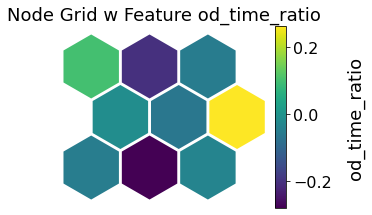

In [35]:
centers = [[node.pos[0],node.pos[1]] for node in net.nodeList]
colnum = 0
colname = features[colnum]

widthP=100
dpi=72
xInch = net.netWidth*widthP/dpi 
yInch = net.netHeight*widthP/dpi 
fig=plt.figure(figsize=(xInch, yInch), dpi=dpi)


cols = [node.weights[colnum] for node in net.nodeList]
ax = hx.plot_hex(fig, centers, cols)
ax.set_title('Node Grid w Feature ' +  colname, size=18)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.0)
cbar=plt.colorbar(ax.collections[0], cax=cax)
cbar.set_label(colname, size=18, labelpad=15)
cbar.ax.tick_params(labelsize=16)
plt.sca(ax)

#plt.show()

In [36]:
#Project the datapoints on the new 2D network map.
#net.project(X)

In [37]:
#Cluster the datapoints according to the Quality Threshold algorithm.
# net.cluster(X[1:100,:], type='qthresh')

## k-means

In [38]:
from sklearn.cluster import KMeans

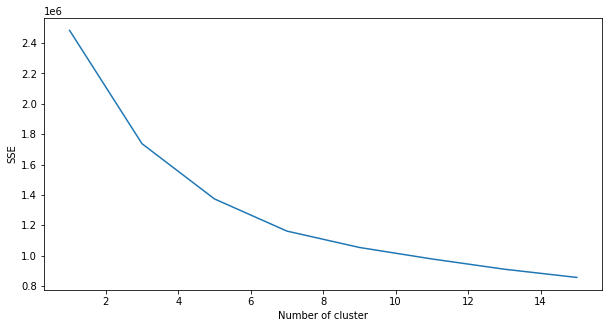

In [39]:
sse = {}
for k in range(1, 17, 2):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(X)
    labels = kmeans.labels_
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [40]:
kmeans = KMeans(n_clusters=9, random_state=42).fit(X)

In [49]:
fig = px.imshow(kmeans.cluster_centers_,
                labels=dict(x="Variable", y="Cluster", color="Variable values"),
                x=features,
                y=["Cluster " + str(n) for n in range(1,10)])
fig.show()

In [42]:
fig = px.imshow([node.weights for node in net.nodeList],
                labels=dict(x="Variable", y="Neuron", color="Weight"),
                x=features,
                y=["Neuron " + str(n) for n in range(1,10)])
fig.show()

## Hierarchical

In [43]:
# hierarchical = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward').fit(X_sample)

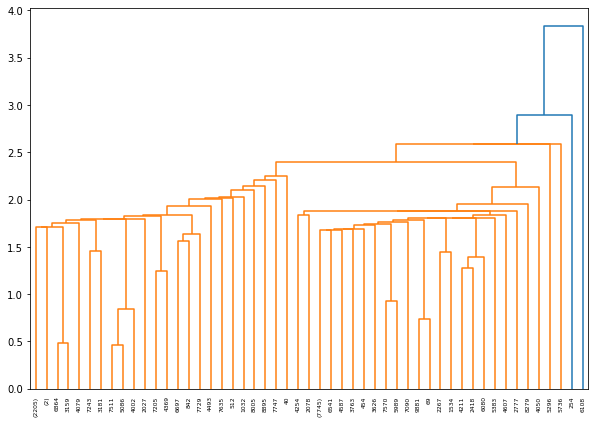

In [54]:
linked = linkage(X_sample, 'single')

labelList = range(1, 11)

plt.figure(figsize=(10, 7))
dendrogram(linked,
           truncate_mode='level',
           p=20,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.show()

## Contingency table

In [45]:
df_selected['kmeans'] = kmeans.labels_

In [46]:
crosstab = pd.crosstab(df_selected['user_type'],
                       df_selected['kmeans'],
                       margins=False)

In [47]:
stats.chi2_contingency(crosstab)

(9700.378339364017,
 0.0,
 8,
 array([[54272.7431307 , 48869.59706871, 24979.6619092 , 55973.58705944,
         66429.82177017, 44442.45854025, 15536.02265371, 30585.52483479,
         68315.58303302],
        [  611.2568693 ,   550.40293129,   281.3380908 ,   630.41294056,
           748.17822983,   500.54145975,   174.97734629,   344.47516521,
           769.41696698]]))

In [48]:
px.imshow(
    pd.crosstab(df_selected['kmeans'],
                df_selected['user_type'].apply(str),
                normalize='columns'),
    labels=dict(x="user_type", color="Percentage"),
    y=["Cluster " + str(n) for n in range(1,10)]
)